In [1]:
# import libraries

import numpy as np
import pandas as pd
from src.neuron import *
from src.utils import *
from src.constants import * 
from src.network import *
from src.validation import *
from src.viz import *
from src.genetic_algorithm import *
from copy import copy
from datetime import datetime
from IPython.display import display, HTML


save_dict = {
    'metadata': { ... },
    'best_dna': None,  # You can ignore this
    'best_score': float('-inf'),  # You can ignore this
    'gen_0': {
        'population': [
            {'dna': [...], 'dna_score': score1},
            {'dna': [...], 'dna_score': score2},
            # ... all DNA sequences in generation 0
        ],
        'timestamp': '...'
    },
    'gen_1': {
        'population': [
            {'dna': [...], 'dna_score': score1},
            {'dna': [...], 'dna_score': score2},
            # ... all DNA sequences in generation 1
        ],
        'timestamp': '...'
    },
    # ... and so on for each generation
}

In [13]:

"""
Successful Runs:
/Users/stevenwendel/Documents/GitHub/bg/data/J_2025-02-21_01-21-45.pkl
/Users/stevenwendel/Documents/GitHub/bg/data/I_2025-02-14_01-24-49.pkl
/Users/stevenwendel/Documents/GitHub/bg/data/explore_B_2025-02-19_00-41-51.pkl
/Users/stevenwendel/Documents/GitHub/bg/data/J_2025-02-21_11-29-39.pkl
/Users/stevenwendel/Documents/GitHub/bg/data/K_2025-02-23_09-19-11.pkl

"""


file_path = '/Users/stevenwendel/Documents/GitHub/bg/data/E_2025-05-07_09-59-55.pkl'

ga_results=load_ga_run_to_df(file_path)

display(ga_results)



,generation,dna,dna_score
0,140,"(2, 1, 21, 1217, -653, 85, 387, 2000, 26, -30,...",650
1,139,"(2, 1, 21, 1217, -653, 85, 387, 2000, 26, -30,...",650
2,139,"(1, 0, 2, 18, -525, 255, 411, 1752, 2, -11, -4...",641
3,140,"(1, 0, 2, 18, -525, 255, 411, 1752, 2, -11, -4...",641
4,140,"(1, 1, 11, 1217, -1105, 166, 335, 1818, 42, -2...",640
...,...,...,...
28195,2,"(1355, 357, 210, 650, -1049, 1471, 877, 1148, ...",346
28196,0,"(800, 852, 717, 929, -1960, 1905, 161, 60, 228...",346
28197,1,"(176, 416, 2000, 650, -789, 1805, 1838, 631, 4...",344
28198,1,"(1605, 428, 945, 1653, -406, 854, 1281, 364, 9...",317


In [14]:
## Counting unique configurations

import pandas as pd

# Assuming ga_results is your DataFrame
qualifier_depth = 10000
max_synapses = 25

# Function to convert DNA list to a tuple of boolean values indicating non-zero elements
def dna_to_nonzero_config(dna):
    return tuple(1 if weight != 0 else 0 for weight in dna)

# Dictionary to store unique configurations and their details
unique_configs = {}
for index, row in ga_results.head(qualifier_depth).iterrows():
    config = dna_to_nonzero_config(row['dna'])
    # Calculate the number of non-zero entries
    non_zero_count = sum(config)
    # Only consider configurations with non-zero counts of 18 or lower
    if non_zero_count <= max_synapses and config not in unique_configs:
        # Store the index, dna_score, and non-zero count
        unique_configs[config] = {
            'index': index,
            'dna_score': row['dna_score'],
            'non_zero_count': non_zero_count
        }

# Print the unique configurations with their details
for config, details in unique_configs.items():
    print(f"Configuration: {config}, Details: {details}")

In [15]:
# Calculate the average weight across TOP 100 DNA
import pandas as pd
import numpy as np

# Assuming ga_results is your DataFrame
# Sort by dna_score to get the top 100 scoring DNA
top_100 = ga_results.nlargest(100, 'dna_score')

# Function to convert DNA list to a tuple of boolean values indicating non-zero elements
def dna_to_nonzero_config(dna):
    return tuple(1 if weight != 0 else 0 for weight in dna)

# Initialize a list to count non-zero occurrences for each position
non_zero_counts = np.zeros(len(top_100.iloc[0]['dna']))

# Initialize a list to sum weights for each position
weight_sums = np.zeros(len(top_100.iloc[0]['dna']))

# Iterate over each DNA list
for index, row in top_100.iterrows():
    dna = row['dna']
    for i, weight in enumerate(dna):
        if weight != 0:
            non_zero_counts[i] += 1
            weight_sums[i] += weight

# Calculate the threshold for 90% presence
threshold = 0.9 * len(top_100)

# Identify positions that are non-zero in 90% or more of the DNA lists
always_on_positions = [i for i, count in enumerate(non_zero_counts) if count >= threshold]

# Calculate average weights for these positions
average_weights = {i: weight_sums[i] / non_zero_counts[i] for i in always_on_positions}

# Assuming ACTIVE_SYNAPSES is a list of tuples like this:
# ACTIVE_SYNAPSES = [('Neuron1', 'Neuron2'), ('Neuron3', 'Neuron4'), ...]

# Map positions to synapses
always_on_synapses = [(ACTIVE_SYNAPSES[i], average_weights[i]) for i in always_on_positions]

# Print the results
print("Synapses that are almost always on (90% or more) in the top 100 scoring DNA:")
for synapse, avg_weight in always_on_synapses:
    print(f"{synapse}: Avg Weight = {avg_weight:.1f}")

Synapses that are almost always on (90% or more) in the top 100 scoring DNA:
['Somat', 'ALMprep']: Avg Weight = 2.8
['Somat', 'ALMresp']: Avg Weight = 12.2
['ALMprep', 'Somat']: Avg Weight = 642.9
['ALMinter', 'Somat']: Avg Weight = -694.4
['ALMresp', 'Somat']: Avg Weight = 393.9
['Somat', 'MSN1']: Avg Weight = 336.6
['Somat', 'MSN2']: Avg Weight = 1845.0
['Somat', 'MSN3']: Avg Weight = 31.7
['MSN1', 'SNR1']: Avg Weight = -23.3
['MSN1', 'SNR2']: Avg Weight = -435.1
['MSN2', 'SNR1']: Avg Weight = -378.3
['MSN2', 'SNR2']: Avg Weight = -758.5
['MSN3', 'SNR1']: Avg Weight = -1653.7
['MSN3', 'SNR2']: Avg Weight = -138.7
['MSN3', 'SNR3']: Avg Weight = -453.5
['SNR1', 'VMprep']: Avg Weight = -49.9
['SNR1', 'VMresp']: Avg Weight = -86.6
['SNR2', 'VMprep']: Avg Weight = -918.6
['SNR2', 'VMresp']: Avg Weight = -205.8
['SNR3', 'VMprep']: Avg Weight = -47.6
['SNR3', 'VMresp']: Avg Weight = -175.2
['VMprep', 'ALMprep']: Avg Weight = 324.2
['VMprep', 'ALMinter']: Avg Weight = 2.1
['VMprep', 'ALMresp

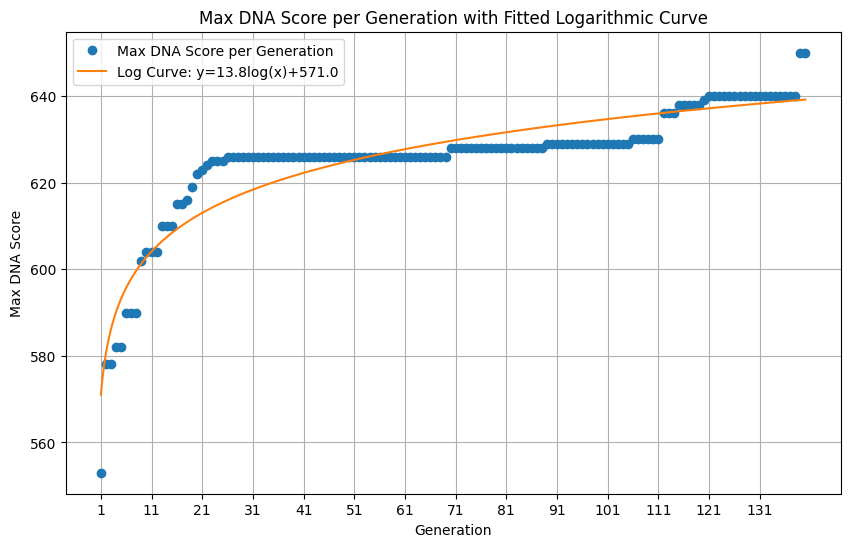

The equation of the fitted curve is: y = 13.79 * log(x) + 571.03


In [16]:
# Max DNA Score per Generation
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

# Assuming df is your DataFrame
# Convert 'generation' column to integers
df=ga_results
df['generation'] = df['generation'].astype(int)

# Group by 'generation' and find the max 'dna_score' for each group
max_scores_per_generation = df.groupby('generation')['dna_score'].max().reset_index()

# Extract the data for fitting
x = max_scores_per_generation['generation'][1:]
y = max_scores_per_generation['dna_score'][1:]

# Define a logarithmic function
def log_func(x, a, b):
    return a * np.log(x) + b

# Fit the logarithmic curve
params, _ = curve_fit(log_func, x, y)
a,b = params

# Generate x values for the fitted curve
x_fit = np.linspace(x.min(), x.max(), 500)
y_fit = log_func(x_fit, *params)

# Plotting
plt.figure(figsize=(10, 6))
plt.plot(x, y, 'o', label='Max DNA Score per Generation')  # Original data
plt.plot(x_fit, y_fit, '-', label=f'Log Curve: y={a:.1f}log(x)+{b:.1f}')  # Fitted curve

# Adding labels and title
plt.xlabel('Generation')
plt.ylabel('Max DNA Score')
plt.title('Max DNA Score per Generation with Fitted Logarithmic Curve')

# Set sparse tick marks
plt.xticks(ticks=x[::10])  # Adjust the step as needed for sparsity

# Show grid for better readability
plt.grid(True)

# Add legend
plt.legend()

# Display the plot
plt.show()


# Print the equation of the curve
print(f"The equation of the fitted curve is: y = {a:.2f} * log(x) + {b:.2f}")

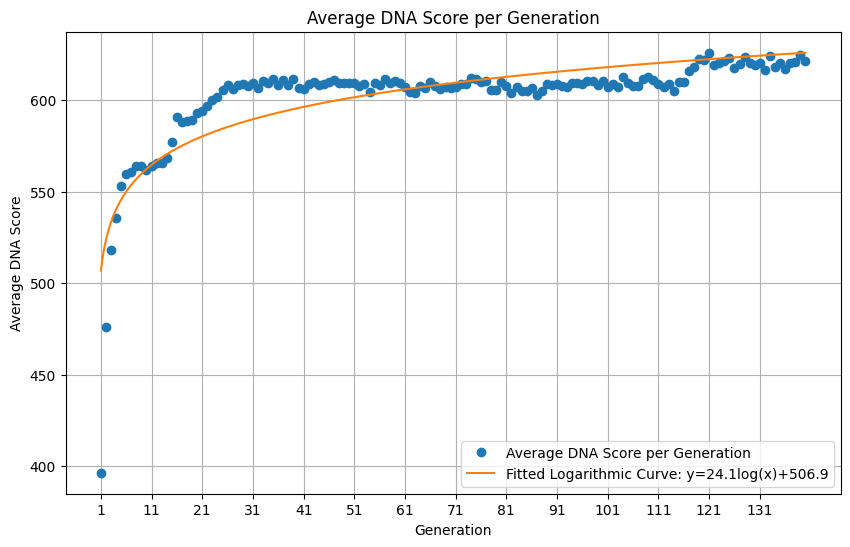

In [17]:
#Average DNA Score per Generation
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

# Assuming df is your DataFrame
# Convert 'generation' column to integers
df['generation'] = df['generation'].astype(int)

# Group by 'generation' and calculate the average 'dna_score' for each group
average_scores_per_generation = df.groupby('generation')['dna_score'].mean().reset_index()

# Extract the data for fitting
x = average_scores_per_generation['generation'][1:]
y = average_scores_per_generation['dna_score'][1:]

# Define a logarithmic function
def log_func(x, a, b):
    return a * np.log(x) + b

# Fit the logarithmic curve
params, _ = curve_fit(log_func, x, y)

# Extract parameters
a, b = params

# Generate x values for the fitted curve
x_fit = np.linspace(x.min(), x.max(), 500)
y_fit = log_func(x_fit, *params)

# Plotting
plt.figure(figsize=(10, 6))
plt.plot(x, y, 'o', label='Average DNA Score per Generation')  # Original data
plt.plot(x_fit, y_fit, '-', label=f'Fitted Logarithmic Curve: y={a:.1f}log(x)+{b:.1f}')  # Fitted curve

# Adding labels and title
plt.xlabel('Generation')
plt.ylabel('Average DNA Score')
plt.title('Average DNA Score per Generation')

# Set sparse tick marks
plt.xticks(ticks=x[::10])  # Adjust the step as needed for sparsity

# Show grid for better readability
plt.grid(True)

# Add legend
plt.legend()

# Display the plot
plt.show()

Number of synapses: 58


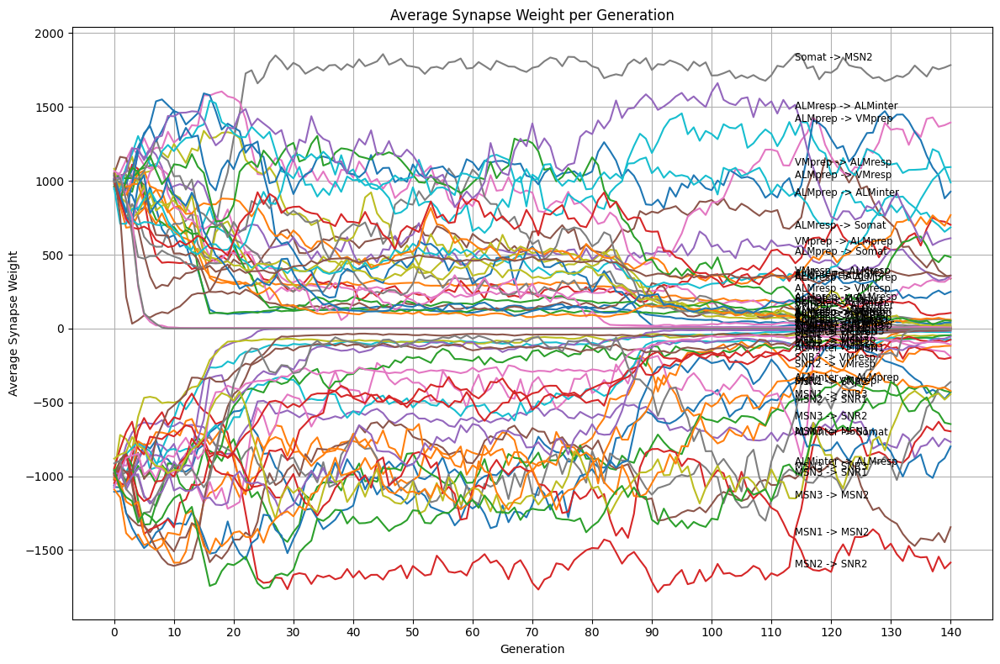

In [18]:
# Evolution of ALL synapse weights over generations
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Assuming df is your DataFrame
# Convert 'generation' column to integers
df['generation'] = df['generation'].astype(int)

# Extract the DNA weights into a separate DataFrame
weights_df = pd.DataFrame(df['dna'].tolist())

# Check the number of synapses
num_synapses = weights_df.shape[1]
print(f"Number of synapses: {num_synapses}")

# Add the generation column to the weights DataFrame
weights_df['generation'] = df['generation']

# Calculate the average weight for each synapse across all generations
average_weights_per_generation = weights_df.groupby('generation').mean().reset_index()

# Assuming ACTIVE_SYNAPSES is a list of tuples like this:
# ACTIVE_SYNAPSES = [('Neuron1', 'Neuron2'), ('Neuron3', 'Neuron4'), ...]

# Create synapse labels from ACTIVE_SYNAPSES
synapse_labels = [f"{pair[0]} -> {pair[1]}" for pair in ACTIVE_SYNAPSES]

# Plotting
plt.figure(figsize=(12, 8))

# Plot each synapse's average weight over generations
for i in range(num_synapses):  # Use the actual number of synapses
    plt.plot(average_weights_per_generation['generation'], average_weights_per_generation[i], label=synapse_labels[i])

    # Annotate each line with its label around generation 100
    gen_100_index = average_weights_per_generation['generation'].searchsorted(average_weights_per_generation.shape[0]*.8)
    if gen_100_index < len(average_weights_per_generation):
        plt.annotate(synapse_labels[i],
                     xy=(average_weights_per_generation['generation'][gen_100_index], average_weights_per_generation[i][gen_100_index]),
                     xytext=(5, 0),  # Offset the text slightly
                     textcoords='offset points',
                     fontsize='small',
                     color='black')

# Adding labels and title
plt.xlabel('Generation')
plt.ylabel('Average Synapse Weight')
plt.title('Average Synapse Weight per Generation')

# Set sparse tick marks
plt.xticks(ticks=average_weights_per_generation['generation'][::10])  # Adjust the step as needed for sparsity

# Show grid for better readability
plt.grid(True)

# Display the plot
plt.tight_layout()
plt.show()

In [19]:
# Evolution of EACH synapse weight over generations
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from ipywidgets import interact, IntSlider

# Assuming df is your DataFrame
# Convert 'generation' column to integers
df['generation'] = df['generation'].astype(int)

# Extract the DNA weights into a separate DataFrame
weights_df = pd.DataFrame(df['dna'].tolist())

# Check the number of synapses
num_synapses = weights_df.shape[1]
print(f"Number of synapses: {num_synapses}")

# Add the generation column to the weights DataFrame
weights_df['generation'] = df['generation']

# Calculate the average weight for each synapse across all generations
average_weights_per_generation = weights_df.groupby('generation').mean().reset_index()

# Assuming ACTIVE_SYNAPSES is a list of tuples like this:
# ACTIVE_SYNAPSES = [('Neuron1', 'Neuron2'), ('Neuron3', 'Neuron4'), ...]

# Create synapse labels from ACTIVE_SYNAPSES
synapse_labels = [f"{pair[0]} -> {pair[1]}" for pair in ACTIVE_SYNAPSES]


def plot_synapse(synapse_index):
    plt.figure(figsize=(12, 8))
    plt.plot(average_weights_per_generation['generation'], average_weights_per_generation[synapse_index], label=synapse_labels[synapse_index])

    # Annotate each line with its label around generation 100
    gen_100_index = average_weights_per_generation['generation'].searchsorted(average_weights_per_generation.shape[0]*.8)
    if gen_100_index < len(average_weights_per_generation):
        plt.annotate(synapse_labels[synapse_index],
                     xy=(average_weights_per_generation['generation'][gen_100_index], average_weights_per_generation[synapse_index][gen_100_index]),
                     xytext=(5, 0),  # Offset the text slightly
                     textcoords='offset points',
                     fontsize='small',
                     color='black')

    # Adding labels and title
    plt.xlabel('Generation')
    plt.ylabel('Average Synapse Weight')
    plt.title(f'Average Synapse Weight per Generation for {synapse_labels[synapse_index]}')

    # Set y-scale from -1000 to 1000
    plt.ylim(-1000, 1000)

    # Set sparse tick marks
    plt.xticks(ticks=average_weights_per_generation['generation'][::10])  # Adjust the step as needed for sparsity

    # Show grid for better readability
    plt.grid(True)

    # Display the plot
    plt.tight_layout()
    plt.show()

# Create an interactive slider to flip through the synapses
interact(plot_synapse, synapse_index=IntSlider(min=0, max=num_synapses-1, step=1, value=0))

Number of synapses: 58


interactive(children=(IntSlider(value=0, description='synapse_index', max=57), Output()), _dom_classes=('widge…

<function __main__.plot_synapse(synapse_index)>

In [9]:
# Synaptic weights for the best run
best_run = ga_results.iloc[0]

# Create a labeled Series for the best run's DNA
best_run_labeled = pd.Series(best_run['dna'], index=[f"{pair[0]} -> {pair[1]}" for pair in ACTIVE_SYNAPSES])
non_zero_count = (best_run_labeled != 0).sum()

display(best_run_labeled)
len(best_run_labeled)
print(non_zero_count)

Somat -> ALMprep       854
Somat -> ALMinter      389
Somat -> ALMresp       515
ALMprep -> Somat       296
ALMinter -> Somat     -598
ALMresp -> Somat       679
Somat -> MSN1          497
Somat -> MSN2          213
Somat -> MSN3          550
MSN1 -> SNR1          -153
MSN1 -> SNR2          -503
MSN1 -> SNR3          -357
MSN2 -> SNR1          -516
MSN2 -> SNR2          -241
MSN2 -> SNR3           -32
MSN3 -> SNR1          -758
MSN3 -> SNR2          -318
MSN3 -> SNR3          -849
SNR1 -> VMprep        -254
SNR1 -> VMresp        -251
SNR2 -> VMprep        -935
SNR2 -> VMresp        -370
SNR3 -> VMprep        -877
SNR3 -> VMresp        -960
VMprep -> ALMprep       28
VMprep -> ALMinter     422
VMprep -> ALMresp      496
VMresp -> ALMprep      336
VMresp -> ALMinter     962
VMresp -> ALMresp      536
ALMprep -> MSN1        717
ALMprep -> MSN2        179
ALMprep -> MSN3        642
ALMinter -> MSN1       -40
ALMinter -> MSN2       -16
ALMinter -> MSN3       -62
ALMresp -> MSN1        561
A

58


In [10]:
# Directed graph of the top 2000 scoring DNA
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np
from ipywidgets import interact, IntSlider

# Filter configurations to only include those with non_zero_count less than 18
filtered_configs = {config: details for config, details in unique_configs.items() if details['non_zero_count'] < 19}

# Function to determine the width of each edge
def get_edge_width(weight):
    return np.ceil(abs(weight) / 200) + 1

# Function to determine the style of each edge
def get_edge_style(weight):
    return 'dashed' if weight < 0 else 'solid'

# Function to plot a specific configuration
def plot_configuration(config_index):
    config, details = list(filtered_configs.items())[config_index]
    print(f"Configuration: {config}, \n Details: {details}")
    
    # Create a labeled Series for the best run's DNA
    best_run_labeled = pd.Series(ga_results.iloc[details['index']]['dna'], index=[f"{pair[0]} -> {pair[1]}" for pair in ACTIVE_SYNAPSES])

    # Create a graph
    G = nx.DiGraph()

    # Add nodes for each neuron
    G.add_nodes_from(NEURON_NAMES)

    # Add edges for non-zero synaptic connections
    for synapse, weight in best_run_labeled.items():
        if weight != 0:
            source, target = synapse.split(' -> ')
            G.add_edge(source, target, weight=weight)

    # Define custom positions for each node
    custom_pos = {
        'Somat': (5, 5.5),
        'MSN1': (5, 4),
        'MSN2': (3, 4),
        'MSN3': (0, 4),
        'SNR1': (5, 2),
        'SNR2': (3, 2),
        'SNR3': (0, 2),
        'ALMinter': (2, 5),
        'PPN': (2, 0),
        'THALgo': (2, 2.5),
        'VMprep': (4, 1),
        'ALMprep': (4, 5),
        'ALMresp': (1, 5),
        'VMresp': (1, 1)
    }

    # Draw the main graph using the custom positions
    plt.figure(figsize=(12, 6))
    edges = G.edges(data=True)
    nx.draw(G, pos=custom_pos, with_labels=True, node_size=3000, node_color='lightblue', font_size=10, font_weight='bold', arrowsize=20,
            width=[get_edge_width(data['weight']) for _, _, data in edges],
            style=[get_edge_style(data['weight']) for _, _, data in edges],
            edge_color='black')  # Default edge color

    # Create a slightly offset position for the overlapping arrows
    offset = 0.09  # Adjust this value to control the offset distance
    offset_pos = {node: (x + offset, y + offset) for node, (x, y) in custom_pos.items()}

    # Draw overlapping arrows for specific connections in always_on_synapses
    G_overlap = nx.DiGraph()
    G_overlap.add_edges_from([(source, target) for (source, target), _ in always_on_synapses])

    # Calculate widths based on avg_weight
    overlap_widths = [get_edge_width(avg_weight) for (_, _), avg_weight in always_on_synapses]

    # Draw these edges with a smaller size and red color, including arrowheads
    nx.draw_networkx_edges(G_overlap, pos=offset_pos, edge_color='red', arrows=True, arrowsize=20, width=overlap_widths)

    # Add edge labels
    edge_labels = nx.get_edge_attributes(G, 'weight')
    nx.draw_networkx_edge_labels(G, pos=custom_pos, edge_labels=edge_labels, font_color='gray')

    plt.title('Non-zero Synaptic Connections with Overlapping Arrows')
    plt.show()

# Create an interactive slider to flip through the filtered configurations
interact(plot_configuration, config_index=IntSlider(min=0, max=len(filtered_configs)-1, step=1, value=0))

TraitError: setting max < min

In [12]:
# Matrix, experimental, and control viz

jh_weights= create_dna_string(new_jh_weights, ACTIVE_SYNAPSES)

curr_dna = ga_results.iloc[0]['dna']
# curr_dna = jh_weights

run_experiment(curr_dna, [1,1,0,1])


    === DNA: (854, 389, 515, 296, -598, 679, 497, 213, 550, -153, -503, -357, -516, -241, -32, -758, -318, -849, -254, -251, -935, -370, -877, -960, 28, 422, 496, 336, 962, 536, 717, 179, 642, -40, -16, -62, 561, 680, 782, 131, 74, 806, 120, -123, -577, -104, -377, -621, -719, 392, 175, -409, -301, 700, 128, 10, 342, 203)
    === Control: 248/500
    === Experimental: 309/500
    === Overall: 557(55.70%)


Currently loaded matrix ---


,Somat,MSN1,SNR1,VMprep,ALMprep,MSN2,SNR2,PPN,THALgo,ALMinter,MSN3,SNR3,ALMresp,VMresp
Somat,0.0,497.0,0.0,0.0,854.0,213.0,0.0,0.0,0.0,389.0,550.0,0.0,515.0,0.0
MSN1,0.0,0.0,-153.0,0.0,0.0,-123.0,-503.0,0.0,0.0,0.0,-577.0,-357.0,0.0,0.0
SNR1,0.0,0.0,0.0,-254.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-251.0
VMprep,0.0,0.0,0.0,0.0,28.0,0.0,0.0,0.0,0.0,422.0,0.0,0.0,496.0,0.0
ALMprep,296.0,717.0,0.0,131.0,0.0,179.0,0.0,0.0,0.0,392.0,642.0,0.0,175.0,74.0
MSN2,0.0,-104.0,-516.0,0.0,0.0,0.0,-241.0,0.0,0.0,0.0,-377.0,-32.0,0.0,0.0
SNR2,0.0,0.0,0.0,-935.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-370.0
PPN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,10.0,0.0,0.0,0.0,0.0,0.0
THALgo,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,342.0,0.0,0.0,203.0,0.0
ALMinter,-598.0,-40.0,0.0,0.0,-409.0,-16.0,0.0,0.0,0.0,0.0,-62.0,0.0,-301.0,0.0


dna_score={'experimental': 309, 'control': 248}: (854, 389, 515, 296, -598, 679, 497, 213, 550, -153, -503, -357, -516, -241, -32, -758, -318, -849, -254, -251, -935, -370, -877, -960, 28, 422, 496, 336, 962, 536, 717, 179, 642, -40, -16, -62, 561, 680, 782, 131, 74, 806, 120, -123, -577, -104, -377, -621, -719, 392, 175, -409, -301, 700, 128, 10, 342, 203)


557